<a href="https://colab.research.google.com/github/sshuklz/Coding-Region-Repeat-Search/blob/master/DomainSearchV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Run URL by clicking play button below to connect to datafiles (may need more permenant solution)

In [63]:
CDSlibrary = 'https://media.githubusercontent.com/media/sshuklz/Coding-Region-Repeat-Search/master/Datasets/Human_full_CDS_libraryV2.csv'
RefTable = 'https://media.githubusercontent.com/media/sshuklz/Coding-Region-Repeat-Search/master/Datasets/Exon2SeqDictionary.csv'
CancerStudy = 'https://media.githubusercontent.com/media/sshuklz/Coding-Region-Repeat-Search/master/Datasets/cancer_study_id.csv'

Specify the following variables for search: Reps, Size and Gap_allowance. YOU 
HAVE TO click all play buttons in order for search parameters to be updated. 


---


Reps: Give a list of amino acids in quotes i.e: 'CAG', 'GAA', 'GCGCGTT' inside square brackets [], note if multiple repeats entered at once i.e: ['CAG', 'GTA'] they must have same length


---


Size: Give repeat stretch minimum size i.e: for 'CAG' and Size = 4 repeats the following are returned: CAGCAGCAGCAG, CAGCAGCAGCAGCAGCAG but not CAGCAG


---


Gap_allowance: Strech of nucleic bases allowed inbetween repeats ie. if Gap_allowance = 1 and 'CAG' repeats, CAG - 'TTT' - CAGCAGCAGCAG - 'CATGGG' - CAGCAGCAGCAGCAG output is CAGTTTCAGCAGCAGCAG






Nucleotide repeat search and Gene dictionary creation:


In [64]:
#@title Repeat search parameters (user input)
Reps = ['CAG'] #@param {type:"raw"}
Size = 12 #@param {type:"slider", min:0, max:100, step:1}
Gap_allowance = 0 #@param {type:"slider", min:0, max:10, step:1}

In [65]:
#@title Search results

import codecs
import requests
from contextlib import closing
import csv
import pandas as pd

import sys, subprocess; subprocess.call([sys.executable, "-m", "pip", "install", 'biopython']); print('biopython' + ' installed\n')
from Bio.Seq import Seq
from Bio.Alphabet import generic_dna

RepLen=0 # repeat length
ResNum=0 # Residue count
DomainLen=0 # domain sequence count
GapNum=0 # Non repeat in continous seq

DNAseq = []
Gene = []
Coord = []
Gene_list = [' ']
Gene_ref_list = [' ']
Gene_dict = pd.DataFrame(columns=['Gene','Transcript','CHR','Exon_num','Exon_ST','Exon_ED','Rep_ST','Rep_ED','Coding_LEN','Exon_LEN','Rep_LEN','Sense'])

GapLength = len(Reps[0])
with closing(requests.get(CDSlibrary, stream=True)) as r:
    reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8'), delimiter=',') 
    
    for row in reader:
        
        DomainLen = 0
        ResNum = 0
        GapNum = 0
        
        for CodonPos in range (round(len(row[2])/3)):
            DomainLen += GapLength
            RepLen += GapLength
            if row[2][DomainLen-3:DomainLen] in Reps : # repeat residues
                ResNum += 1
                GapNum = 0

            else:
                GapNum += GapLength

                if GapNum >= Gap_allowance*GapLength:

                    if ResNum >= Size: 
                        
                        Gene_ref = row[0] + ': ' + row[1]; Up_down_stream_adj = 0
                        Coord = [((CodonPos*GapLength) - RepLen + 3),(CodonPos*GapLength)+(GapLength*2) - GapNum - 3]
                        
                        with closing(requests.get(RefTable, stream=True)) as r:
                            reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8'), delimiter=',') 
                            for ref in reader:
                               
                                if ref[1] == row[1]:
                                    stop = 0; Rep_ST = 0; Rep_ED = 0
                                    
                                    if int(ref[8]) == 1:
                                            
                                        if Coord[0] > int(ref[7]) or Coord[1] < int(ref[6]):
                                            stop = 1; Up_down_stream_adj = 0
                                        
                                        Rep_ST = int(ref[3])
                                        Rep_ED = int(ref[4]) 
                                        
                                        if Coord[0] > int(ref[6]):
                                            Rep_ST = int(ref[3]) + (Coord[0] - int(ref[6])) - 1
                                            
                                        if Coord[1] < int(ref[7]):
                                            Rep_ED = int(ref[4]) - (int(ref[7]) - Coord[1]) - 1 + Up_down_stream_adj
                                               
                                    if int(ref[8]) == -1:
                                            
                                        if Coord[0] > int(ref[7]) or Coord[1] < int(ref[6]):
                                            stop = 1; Up_down_stream_adj = 0
                                            
                                        Rep_ST = int(ref[3])
                                        Rep_ED = int(ref[4])
                                        
                                        if Coord[0] > int(ref[6]):
                                            Rep_ED = int(ref[4]) - (Coord[0] - int(ref[6]))
                                            
                                        if Coord[1] < int(ref[7]):
                                            Rep_ST = int(ref[3]) + (int(ref[7]) - Coord[1]) - Up_down_stream_adj
                                    
                                    Elen = int(ref[4]) - int(ref[3]); Rlen = Rep_ED - Rep_ST;
                                    
                                    if stop != 1:       
                                        Gene_dict = Gene_dict.append({'Gene': ref[0],'Transcript': ref[1],'CHR': ref[2],'Exon_num':ref[5],'Exon_ST': int(ref[3]),'Exon_ED': int(ref[4]),'Rep_ST': Rep_ST,'Rep_ED': Rep_ED,'Coding_LEN': len(row[2]),'Exon_LEN': Elen,'Rep_LEN': Rlen,'Sense': ref[8]}, ignore_index=True)
                                        Up_down_stream_adj = 1
                                    else:
                                        Up_down_stream_adj = 0
                                    
                        DNAseq = row[2][(CodonPos*GapLength)-RepLen:(CodonPos*GapLength)+(GapLength*2) - GapNum]
                        AAseq = Seq(DNAseq, generic_dna).translate()
                        
                        if row[0] not in Gene_list or Gene_ref in Gene_ref_list:
                            if row[0] not in Gene_list:
                                Gene_list = Gene_list + [row[0]]
                            
                            print(Gene_ref) 
                            print ('DNAseq: ' + str(DNAseq)) 
                            print('AAseq: ' + str(AAseq) +'\n')
                            
                        Gene_ref_list = Gene_ref_list + [Gene_ref]
                        
                    ResNum = 0
                    RepLen = 0

Gene_dict = Gene_dict.drop_duplicates(subset = ['Gene','Rep_ST','Rep_ED'])
print('Genes with repeating elements: ')                    
print(Gene_list[1:])
print('\n Refrence dictionary: \n')

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
    display(Gene_dict.style.hide_index())

biopython installed

AR: ENST00000374690.3
DNAseq: CTGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAA
AAseq: LQQQQQQQQQQQQQQQQQQQQQQQ

ASCL1: ENST00000266744.3
DNAseq: GCGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGGCG
AAseq: AQQQQQQQQQQQQA

ATN1: ENST00000356654.4
DNAseq: CAACAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAT
AAseq: QQQQQQQQQQQQQQQQH

ATXN1: ENST00000244769.4
DNAseq: GAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAT
AAseq: EQQQQQQQQQQQQH

ATXN1: ENST00000244769.4
DNAseq: CATCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAC
AAseq: HQQQQQQQQQQQQQQH

ATXN1: ENST00000436367.1
DNAseq: CATCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAC
AAseq: HQQQQQQQQQQQQQQH

ATXN2: ENST00000377617.3
DNAseq: CCCCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAA
AAseq: PQQQQQQQQQQQQQQ

CACNA1A: ENST00000360228.5
DNAseq: CCGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGGCG
AAseq: PQQQQQQQQQQQQQA

EP400: ENST00000389561.2
DNAseq: CAACAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAGCAA
AAseq: QQQQQQQQQQQQQQQQ

HTT: E

Gene,Transcript,CHR,Exon_num,Exon_ST,Exon_ED,Rep_ST,Rep_ED,Coding_LEN,Exon_LEN,Rep_LEN,Sense
AR,ENST00000374690.3,X,1,66764989,66766604,66765158,66765224,2763,1615,66,1
ASCL1,ENST00000266744.3,12,1,103352023,103352733,103352171,103352207,711,710,36,1
ATN1,ENST00000356654.4,12,5,7044710,7046724,7045890,7045935,3573,2014,45,1
ATXN1,ENST00000244769.4,6,8,16326625,16328541,16327918,16327954,2448,1916,36,-1
ATXN1,ENST00000244769.4,6,8,16326625,16328541,16327867,16327909,2448,1916,42,-1
ATXN2,ENST00000377617.3,12,1,112036588,112037318,112036785,112036824,3942,730,39,-1
CACNA1A,ENST00000360228.5,19,47,13318127,13318867,13318673,13318712,7521,740,39,-1
EP400,ENST00000389561.2,12,47,132547011,132547246,132547092,132547134,9372,235,42,1
HTT,ENST00000355072.5,4,1,3076553,3076815,3076602,3076659,9429,262,57,1
KCNN3,ENST00000271915.4,1,1,154841508,154842440,154842201,154842243,2196,932,42,-1


CBioPortal Query and mutation dataset fetch, Generate MUT dictionary: 

In [66]:
#@title Search results
import pandas as pd
import requests
import codecs
from contextlib import closing
import csv
               
case_list = ' ' # TCGA cohort names
gene_profile = ' ' # TCGA cohort mutation data
gene_list = ("+".join(Gene_list))[2:] # carried over Gene_list

with closing(requests.get(CancerStudy, stream=True)) as r:
    reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8')) 
    next(reader)
    for row in reader:
        case_list = case_list + "+" + ''.join(row)

case_list = case_list[2:]

with closing(requests.get(CancerStudy, stream=True)) as r:
    reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8')) 
    next(reader)
    for row in reader:
        gene_profile = gene_profile + "_mutations+" + ''.join(row)

gene_profile = gene_profile[12:]
         
web_str = "https://www.cbioportal.org/webservice.do?cmd=getMutationData&case_set_id=" + \
            case_list + "&genetic_profile_id=" + gene_profile + "&gene_list=" + gene_list

print('Custom generated URL from refrence dictionary:')
print(web_str + "\n" )

import urllib.request    
urllib.request.urlretrieve(web_str, "CbioDATA.txt")

Mut_dict = pd.DataFrame(columns=['gene_symbol', 'case_id', 'sequencing_center', 'mutation_status', 'mutation_type', 'validation_status', 'amino_acid_change', 'functional_impact_score', 'xvar_link', 'xvar_link_pdb', 'xvar_link_msa', 'chr', 'start_position', 'end_position', 'reference_allele', 'variant_allele', 'reference_read_count_tumor', 'variant_read_count_tumor', 'reference_read_count_normal', 'variant_read_count_normal', 'genetic_profile_id','ExonMut','RepMut'])
Row_num = 0

print('Generating MutDict fromm CBio data (takes a while): \n')

with open ('CbioDATA.txt', 'r') as csv_file:
    csvread = csv.reader(csv_file, delimiter='\t')
    for row in csvread:
        if len(row) == 22 and row[12] != 'NA' and row != ['entrez_gene_id', 'gene_symbol', 'case_id', 'sequencing_center', 'mutation_status', 'mutation_type', 'validation_status', 'amino_acid_change', 'functional_impact_score', 'xvar_link', 'xvar_link_pdb', 'xvar_link_msa', 'chr', 'start_position', 'end_position', 'reference_allele', 'variant_allele', 'reference_read_count_tumor', 'variant_read_count_tumor', 'reference_read_count_normal', 'variant_read_count_normal', 'genetic_profile_id']:
            MutData = row[1:]

            ExonMut = 'No'; RepMut = 'No'
            for index, row1 in Gene_dict.iterrows():
                if row[1] == row1[0]:
                    if int(row[13]) >= (row1[4]) and int(row[13]) <= (row1[5]):
                        ExonMut = 'Yes'
                        if int(row[13]) >= (row1[6]) and int(row[13]) <= (row1[7]):
                            RepMut = 'Yes'
                    if int(row[14]) >= (row1[4]) and int(row[14]) <= (row1[5]):
                        ExonMut = 'Yes'
                        if int(row[14]) >= (row1[6]) and int(row[14]) <= (row1[7]):
                            RepMut = 'Yes'

            MutData.append(ExonMut); MutData.append(RepMut)
            Mut_dict.loc[Row_num] = MutData; Row_num+=1

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
  display(Mut_dict.style.hide_index())

Custom generated URL from refrence dictionary:
https://www.cbioportal.org/webservice.do?cmd=getMutationData&case_set_id=acc_tcga_pan_can_atlas_2018+blca_tcga_pan_can_atlas_2018+lgg_tcga_pan_can_atlas_2018+brca_tcga_pan_can_atlas_2018+cesc_tcga_pan_can_atlas_2018+chol_tcga_pan_can_atlas_2018+coadread_tcga_pan_can_atlas_2018+dlbc_tcga_pan_can_atlas_2018+esca_tcga_pan_can_atlas_2018+gbm_tcga_pan_can_atlas_2018+hnsc_tcga_pan_can_atlas_2018+kich_tcga_pan_can_atlas_2018+kirc_tcga_pan_can_atlas_2018+kirp_tcga_pan_can_atlas_2018+lihc_tcga_pan_can_atlas_2018+luad_tcga_pan_can_atlas_2018+lusc_tcga_pan_can_atlas_2018+meso_tcga_pan_can_atlas_2018+ov_tcga_pan_can_atlas_2018+paad_tcga_pan_can_atlas_2018+pcpg_tcga_pan_can_atlas_2018+prad_tcga_pan_can_atlas_2018+sarc_tcga_pan_can_atlas_2018+skcm_tcga_pan_can_atlas_2018+stad_tcga_pan_can_atlas_2018+tgct_tcga_pan_can_atlas_2018+thym_tcga_pan_can_atlas_2018+thca_tcga_pan_can_atlas_2018+ucs_tcga_pan_can_atlas_2018+ucec_tcga_pan_can_atlas_2018+uvm_tcga_pan

gene_symbol,case_id,sequencing_center,mutation_status,mutation_type,validation_status,amino_acid_change,functional_impact_score,xvar_link,xvar_link_pdb,xvar_link_msa,chr,start_position,end_position,reference_allele,variant_allele,reference_read_count_tumor,variant_read_count_tumor,reference_read_count_normal,variant_read_count_normal,genetic_profile_id,ExonMut,RepMut
ATXN1,TCGA-OR-A5KB-01,.,.,Missense_Mutation,.,R7L,,,,,6,16328522,16328522,C,A,17,4,8,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
CACNA1A,TCGA-OR-A5J5-01,.,.,Missense_Mutation,.,V1646M,,,,,19,13356010,13356010,C,T,80,74,94,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
CACNA1A,TCGA-OR-A5J5-01,.,.,Missense_Mutation,.,W1447C,,,,,19,13370425,13370425,C,A,94,99,157,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
CACNA1A,TCGA-OR-A5KB-01,.,.,Missense_Mutation,.,E118D,,,,,19,13565966,13565966,C,A,35,53,109,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
HTT,TCGA-PK-A5HB-01,.,.,Missense_Mutation,.,A894V,,,,,4,3137678,3137678,C,T,96,38,135,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
HTT,TCGA-PK-A5HB-01,.,.,Missense_Mutation,.,S3064F,,,,,4,3240681,3240681,C,T,63,52,72,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
KCNN3,TCGA-OR-A5JA-01,.,.,Missense_Mutation,.,A229S,,,,,1,154841756,154841756,C,A,66,12,106,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
MAML3,TCGA-PK-A5HB-01,.,.,Missense_Mutation,.,D264V,,,,,4,140811799,140811799,T,A,24,40,128,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
NCOR2,TCGA-OR-A5JK-01,.,.,Missense_Mutation,.,Y479C,,,,,12,124904549,124904549,T,C,32,28,87,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
RAI1,TCGA-OR-A5KB-01,.,.,Missense_Mutation,.,D1762H,,,,,17,17701546,17701546,G,C,53,13,12,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,No


Generating data tables and graphs: 



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in long_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:139: RuntimeWarning: invalid value encountered in long_scalars


Mean tumor allele frequency                                \
                          All exons Exons w/ repeat Repeat domain   
ATXN1                         0.289           0.298         0.366   
EP400                         0.279           0.262         0.240   
MAML2                         0.258           0.277         0.405   
HTT                           0.259           0.406         0.500   
SMARCA2                       0.303           0.333         0.304   
ZNF384                        0.262           0.273         0.243   
KCNN3                         0.253           0.245         0.214   
MAML3                         0.266           0.234         0.200   
CACNA1A                       0.279           0.194         0.000   
ATXN2                         0.263           0.000         0.000   
ASCL1                         0.293           0.293         0.000   
MED15                         0.243           0.219         0.000   
NCOR2                         0.286           0.292         0.000   
RAI1                          0.302           0.303         0.000   
ATN1                          0.273           0.277         0.000   
TBP                           0.252           0.287         0.000   
VEZF1                         0.273           0.295         0.000   
AR                            0.321           0.332         0.000   

        Mutation sites per BP                               Impact score  \
                    All exons Exons w/ repeat Repeat domain    All exons   
ATXN1                   0.062           0.066         0.077        0.018   
EP400                   0.050           0.034         0.048        0.014   
MAML2                   0.050           0.049         0.026        0.013   
HTT                     0.042           0.008         0.018        0.011   
SMARCA2                 0.060           0.048         0.026        0.018   
ZNF384                  0.060           0.050         0.024        0.016   
KCNN3                   0.060           0.048         0.024        0.015   
MAML3                   0.037           0.037         0.018        0.010   
CACNA1A                 0.058           0.004         0.000        0.016   
ATXN2                   0.047           0.000         0.000        0.012   
ASCL1                   0.045           0.045         0.000        0.013   
MED15                   0.052           0.069         0.000        0.013   
NCOR2                   0.051           0.057         0.000        0.015   
RAI1                    0.045           0.045         0.000        0.014   
ATN1                    0.042           0.043         0.000        0.012   
TBP                     0.049           0.036         0.000        0.012   
VEZF1                   0.042           0.019         0.000        0.012   
AR                      0.061           0.040         0.000        0.019   

                                       
        Exons w/ repeat Repeat domain  
ATXN1             0.020         0.028  
EP400             0.009         0.011  
MAML2             0.013         0.010  
HTT               0.003         0.009  
SMARCA2           0.016         0.008  
ZNF384            0.014         0.006  
KCNN3             0.012         0.005  
MAML3             0.009         0.004  
CACNA1A           0.001         0.000  
ATXN2             0.000         0.000  
ASCL1             0.013         0.000  
MED15             0.015         0.000  
NCOR2             0.017         0.000  
RAI1              0.014         0.000  
ATN1              0.012         0.000  
TBP               0.010         0.000  
VEZF1             0.005         0.000  
AR                0.013         0.000




       Mean tumor allele frequency                          Mutation sites per BP                               Impact score


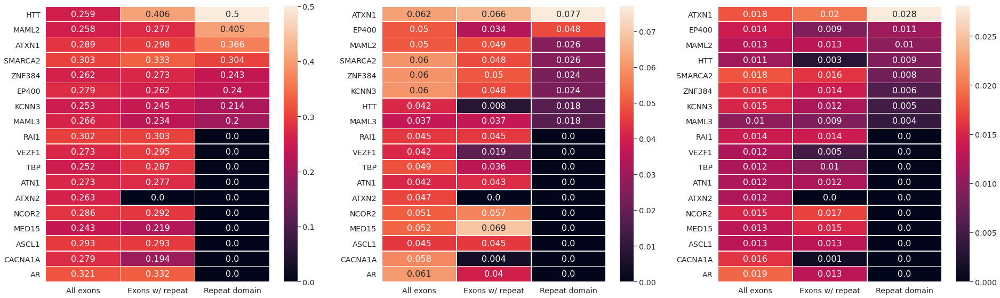


 Mutation type raw count table:


Total                               BlosumScore of Missense  \
        All exons Exons w/ repeat Repeat domain               All exons   
AR            190              70             0                     -50   
ASCL1          36              36             0                     -16   
ATN1          171              96             0                     -90   
ATXN1         177             148             8                     -96   
ATXN2         201               0             0                     -98   
CACNA1A       512               3             0                    -154   
EP400         524               9             2                    -223   
HTT           456               2             1                    -146   
KCNN3         155              54             1                     -48   
MAML2         187              84             1                    -102   
MAML3         144              69             1                     -68   
MED15         137              26             0                     -65   
NCOR2         465              11             0                    -268   
RAI1          289             281             0                    -159   
SMARCA2       322              22             1                    -153   
TBP            59              16             0                     -43   
VEZF1          67               3             0                     -11   
ZNF384         97              25             1                     -58   

                                       Missense                                \
        Exons w/ repeat Repeat domain All exons Exons w/ repeat Repeat domain   
AR                  -22             0       163              65             0   
ASCL1               -16             0        34              34             0   
ATN1                -78             0       147              81             0   
ATXN1               -88             1       149             126             7   
ATXN2                 0             0       164               0             0   
CACNA1A               4             0       426               3             0   
EP400                 2             0       452               6             0   
HTT                   1             0       364               1             0   
KCNN3               -22            -2       133              42             1   
MAML2               -53             0       153              68             1   
MAML3               -22             1       127              60             1   
MED15               -11             0       109              22             0   
NCOR2                -3             0       381               8             0   
RAI1               -156             0       227             225             0   
SMARCA2             -25            -1       276              20             1   
TBP                 -12             0        49              15             0   
VEZF1                 1             0        56               1             0   
ZNF384              -14             0        77              19             0   

         Nonsense                                Deletion                  \
        All exons Exons w/ repeat Repeat domain All exons Exons w/ repeat   
AR             11               1             0         1               1   
ASCL1           0               0             0         0               0   
ATN1            4               2             0         1               1   
ATXN1           6               5             0         0               0   
ATXN2          17               0             0         0               0   
CACNA1A        27               0             0         1               0   
EP400          26               1             0         2               0   
HTT            34               0             0         4               1   
KCNN3           5               1             0         0               0   
MAML2          19              12          


 Mutation type as fraction of mutations in a given domain


In [67]:
#@title Graph generation (in progress)
import matplotlib.pyplot as plt
import numpy as np
from Bio.SubsMat.MatrixInfo import blosum62
import seaborn as sns

BlosumDict = blosum62
columns = pd.MultiIndex.from_product([['Mean tumor allele frequency','Mutation sites per BP', 'Impact score'], ['All exons', 'Exons w/ repeat', 'Repeat domain']])
Mut_HeatMap = pd.DataFrame(index = Gene_list[1:], columns = columns)
Mut_domainlenVSImpact = pd.DataFrame(index = Gene_list[1:], columns = ['DomainLen_all','DomainLen_exons','DomainLen_reps'])
columns_raw = pd.MultiIndex.from_product([['Total','BlosumScore of Missense','Missense','Nonsense','Deletion','Insertion','Splice','FrameShift'], ['All exons', 'Exons w/ repeat', 'Repeat domain']])
columns_div = pd.MultiIndex.from_product([['Missense','Nonsense','Deletion','Insertion','Splice','FrameShift'], ['All exons', 'Exons w/ repeat', 'Repeat domain']])
Mut_TypeMap_raw = pd.DataFrame(index = Gene_list[1:], columns = columns_raw)
Mut_TypeMap_div = pd.DataFrame(index = Gene_list[1:], columns = columns_div)

def Freqfind(rownum1, rownum2, rownum3, rownum4):
    FreqNum = 0
    if rownum4 != 0: # subtract tumor allele frequenies by normal allele frequncy if not 0
        FreqNum = (rownum2 / (rownum1 + rownum2)) - (rownum4 / (rownum3 + rownum4))
    else:
        FreqNum = (rownum2 / (rownum1 + rownum2))
    return FreqNum

def MUTfind(rownum):
    MS = 0 ; FR = 0 ; DEL = 0; INS = 0; SP = 0; NS = 0

    if 'Missense_Mutation' in str(rownum):
        MS += 1
    elif 'Nonsense_Mutation' in str(rownum):
        NS += 1
    elif 'In_Frame_Del' in str(rownum):
        DEL += 1
    elif 'In_Frame_Ins' in str(rownum):
        INS += 1
    elif 'Splice' in str(rownum):
        SP += 1
    elif 'Frame_Shift' in str(rownum):
        FR += 1

    return MS, NS, DEL, INS, SP, FR

def BLOSUMscore(rownum, rownum1, rownum2):
    score = 0;
    if 'Missense_Mutation' in str(rownum):
        if (rownum1,rownum2) in BlosumDict:
            score = BlosumDict[(rownum1,rownum2)]
        if (rownum2,rownum1) in BlosumDict:
            score = BlosumDict[(rownum2,rownum1)]           
    return score 

print('Generating data tables and graphs: \n'); last = ''
for index, row1 in Gene_dict.iterrows():

    if row1[0] != last:
        LoopNum = 0
        last = row1[0]
        track = row1[3]
        Freq1 = 0; Freq2 = 0; Freq3 = 0
        MutTotal = np.array([0,0,0])
        MutSites = np.array([0,0,0])
        DomainLen = np.array([row1[8],row1[9],row1[10]])
        Mut_type_all = np.array([0,0,0,0,0,0])
        Mut_type_exons = np.array([0,0,0,0,0,0])
        Mut_type_rep = np.array([0,0,0,0,0,0]) 
        Mut_Pos_list = [' ']
        Blosum_score = np.array([0,0,0])
        New_mut_pos = 'No'

    if LoopNum > 0:
        DomainLen[2] += int(row1[10])
        if track != row1[3]:
            track = row1[3]
            DomainLen[1] += int(row1[9])
    
    LoopNum += 1   

    for index, row2 in Mut_dict.iterrows():

        if row2[13] not in Mut_Pos_list or row2[14] not in Mut_Pos_list:
            Mut_Pos_list = Mut_Pos_list + [row2[13]] + [row2[14]]
            New_mut_pos = 'Yes'
        else:
            New_mut_pos = 'No'

        if row2[0] == row1[0] and LoopNum == 1:
            if New_mut_pos == 'Yes':
                MutSites[0] += 1
            MutTotal[0] += 1
            Mut_type_all += np.array(MUTfind(row2[4]))
            Blosum_score[0] += BLOSUMscore(row2[4],row2[6][0],row2[6][-1])
            Freq1 += Freqfind(int(row2[16]),int(row2[17]),int(row2[18]),int(row2[19]))
            
            if row2[21] == 'Yes' and LoopNum == 1: 
                if New_mut_pos == 'Yes':
                    MutSites[1] += 1
                MutTotal[1] += 1
                Mut_type_exons += np.array(MUTfind(row2[4]))
                Blosum_score[1] += BLOSUMscore(row2[4],row2[6][0],row2[6][-1])
                Freq2 += Freqfind(int(row2[16]),int(row2[17]),int(row2[18]),int(row2[19]))

            if row2[22] == 'Yes' and LoopNum == 1:
                if New_mut_pos == 'Yes':
                    MutSites[2] += 1
                MutTotal[2] += 1
                Mut_type_rep += np.array(MUTfind(row2[4]))
                Blosum_score[2] += BLOSUMscore(row2[4],row2[6][0],row2[6][-1])
                Freq3 += Freqfind(int(row2[16]),int(row2[17]),int(row2[18]),int(row2[19]))    
   
    if MutTotal[0] != 0:
        gene_values = [0,0,0,0,0,0,0,0,0]
        gene_values[0] = Freq1/MutTotal[0]
        gene_values[3] = MutSites[0]/DomainLen[0]
        gene_values[6] = gene_values[0]*gene_values[3]
        #if Mut_type_all[0] != 0:
        #    Blosum_score[0] = Blosum_score[0] / Mut_type_all[0]
                    
        if not MutTotal[1] == 0: 
            gene_values[1] = Freq2/MutTotal[1]
            gene_values[4] = MutSites[1]/DomainLen[1]
            gene_values[7] = gene_values[1]*gene_values[4]
            #if Mut_type_exons[0] != 0:
            #    Blosum_score[1] = Blosum_score[1] / Mut_type_exons[0]
            
            if not MutTotal[2] == 0:
                gene_values[2] = Freq3/MutTotal[2]
                gene_values[5] = MutSites[2]/DomainLen[2]
                gene_values[8] = gene_values[2]*gene_values[5]
                #if Mut_type_rep[0] != 0:
                #    Blosum_score[2] = Blosum_score[2] / Mut_type_rep[0]

        MutTypeCmb = []
        MutTypeCmb_div = []

        for i in range(6):
            MutTypeCmb = np.append(MutTypeCmb,Mut_type_all[i])
            MutTypeCmb = np.append(MutTypeCmb,Mut_type_exons[i])
            MutTypeCmb = np.append(MutTypeCmb,Mut_type_rep[i])
            MutTypeCmb_div = np.append(MutTypeCmb_div,(Mut_type_all[i]/MutTotal[0]))
            MutTypeCmb_div = np.append(MutTypeCmb_div,(Mut_type_exons[i]/MutTotal[1]))
            MutTypeCmb_div = np.append(MutTypeCmb_div,(Mut_type_rep[i]/MutTotal[2])) 

        MutTypeCmb_raw = np.append(Blosum_score,MutTypeCmb)
        MutTypeCmb_raw = np.append(MutTotal,MutTypeCmb_raw)
        Mut_HeatMap.loc[row1[0]] = gene_values
        Mut_TypeMap_raw.loc[row1[0]] = MutTypeCmb_raw
        Mut_TypeMap_div.loc[row1[0]] = MutTypeCmb_div

Mut_HeatMap = Mut_HeatMap.sort_values([('Impact score', 'Repeat domain')], ascending=False).fillna(0).round(3)
Mut_TypeMap_div = Mut_TypeMap_div.fillna(0).round(3)

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
  display(Mut_HeatMap)

Mut_HeatMap1 = Mut_HeatMap.sort_values([('Mean tumor allele frequency', 'Repeat domain')], ascending=False)
Mut_HeatMap2 = Mut_HeatMap.sort_values([('Mutation sites per BP', 'Repeat domain')], ascending=False)
Mut_HeatMap3 = Mut_HeatMap.sort_values([('Impact score', 'Repeat domain')], ascending=False)

print('\n')
print('\n       Mean tumor allele frequency                          Mutation sites per BP                               Impact score')

fig, ax =plt.subplots(1,3,figsize=(32,(len(Gene_list)/2)))

sns.set(font_scale=1.3)
sns.heatmap(Mut_HeatMap1['Mean tumor allele frequency'], linewidths=.5, fmt="",square=False, annot_kws={"size": 16}, annot=True, ax=ax[0])
sns.heatmap(Mut_HeatMap2['Mutation sites per BP'], linewidths=.5, fmt="",square=False, annot_kws={"size": 16}, annot=True, ax=ax[1])
sns.heatmap(Mut_HeatMap3['Impact score'], linewidths=.5, fmt="",square=False, annot_kws={"size": 16}, annot=True, ax=ax[2])
plt.show()

print('\n Mutation type raw count table:')

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
  display(Mut_TypeMap_raw)

print('\n Mutation type as fraction of mutations in a given domain')

